In [2]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import pickle
import os
import sys
sys.path.insert(0, '..')
from titan.Experiment import Experiment
from titan.plt_Experiment_summary import titan_plt_summary, titan_plt_summary_temp
from titan.load_and_preprocessing import titan_load_and_preprocessing
import sigmoid_fitting as sp
from titan.processing_DNA import titan_plt_infl
from scipy.ndimage import convolve1d
from sklearn.manifold import TSNE

In [3]:
n_wells = 10
n_a_type = "v04"
exp_folder = "/Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/"
exp_path = Path(exp_folder, "D20250808_E00_C00_F4500KHz_U_Sample_7")


ori_curve_path = f'{exp_path}/original_curves.pkl'
adj_curve_path = f'{exp_path}/min_val_inc_curves.pkl'

if (os.path.exists(ori_curve_path)):
    print(f"Load data from file: {ori_curve_path}")
    with open(ori_curve_path, 'rb') as file:
        ori_curve = pickle.load(file)

if (os.path.exists(adj_curve_path)):
    print(f"Load data from file: {adj_curve_path}")
    with open(adj_curve_path, 'rb') as file:
        adj_curve = pickle.load(file)

Load data from file: /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/original_curves.pkl
Load data from file: /Users/kautsarg/Library/CloudStorage/OneDrive-ImperialCollegeLondon/Final Project/Run Data/trial test data/D20250808_E00_C00_F4500KHz_U_Sample_7/min_val_inc_curves.pkl


In [4]:
[key for key in enumerate(ori_curve)]

[(0, 'X_time'),
 (1, 'Y_well'),
 (2, 'ori'),
 (3, 'moving_avg'),
 (4, 'sigmoid_5p')]

In [5]:
from sklearn import preprocessing

def normalise_curve(time, curves, wells):
    y_transposed = curves.T 

    scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))

    scaled_data_transposed = scaler.fit_transform(y_transposed)

    df_scaled = pd.DataFrame(
        scaled_data_transposed.T, 
        columns=np.char.add("Cycle", time.astype(str))
    )

    scaled_curves = pd.DataFrame({
        'row_min': scaler.data_min_,
        'row_max': scaler.data_max_,
        'row_range': scaler.data_range_,
        'well': wells
    })
    return pd.concat([scaled_curves, df_scaled], axis=1)

def denormalise_curve(df):
    df_unscaled = df.copy()

    time_cols = [col for col in df.columns if col.startswith("time_")]
    df_unscaled[time_cols] = df[time_cols].multiply(df['row_max'] - df['row_min'], axis=0).add(df['row_min'], axis=0)
    
    return df_unscaled

In [115]:
ori_ac_data = normalise_curve(ori_curve["X_time"],  ori_curve["ori"]["curves"], ori_curve["Y_well"])
moving_avg_data = normalise_curve(ori_curve["X_time"],  ori_curve["moving_avg"]["curves"], ori_curve["Y_well"])
sigmoid_5p_data = normalise_curve(ori_curve["X_time"],  ori_curve["sigmoid_5p"]["curves"], ori_curve["Y_well"])


In [118]:
def plot_curves(df):
    
    labels = df.well.unique()
    y_wells = df.well.values

    y = df.filter(like='Cycle').values
    X = np.array([s.replace('Cycle' , '') for s in sigmoid_5p_data.filter(like='Cycle').columns]).astype(float)
    fig, ax = plt.subplots(2, len(labels), figsize=(len(labels)*6, 2*6))
    
    for well in labels:
        idx = np.where(y_wells==well)
        y_filter = y[idx]
        ax[0][well].plot(X, y_filter.T, color=plt.cm.tab10(well), alpha=0.1, linewidth=0.25)
        ax[0][well].plot(X, np.mean(y_filter,axis=0).T, color=plt.cm.tab10(well), alpha=1, linewidth=2)
        ax[0][well].set_title(f"Well-{well} (n={y_filter.shape[0]})")

    df_denorm = denormalise_curve(df)
    y_denorm = df_denorm.filter(like='Cycle').values
    for well in labels:
        idx = np.where(y_wells==well)
        y_filter = y_denorm[idx]
        ax[1][well].plot(X, y_filter.T, color=plt.cm.tab10(well), alpha=0.1, linewidth=0.25)
        ax[1][well].plot(X, np.mean(y_filter,axis=0).T, color=plt.cm.tab10(well), alpha=1, linewidth=2)
        ax[1][well].set_title(f"Well-{well} (n={y_filter.shape[0]})")

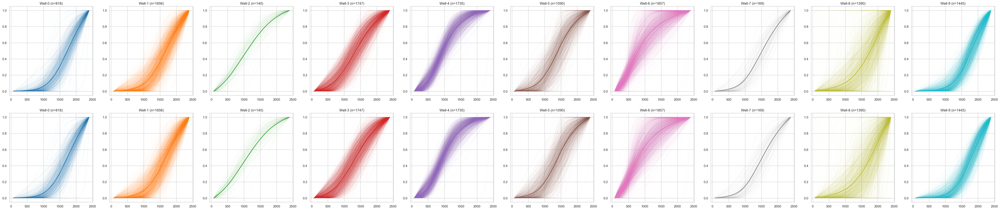

In [119]:
plot_curves(sigmoid_5p_data)
sigmoid_5p_data.to_csv(f'{exp_path}/sigmoid_df.csv',index=False)

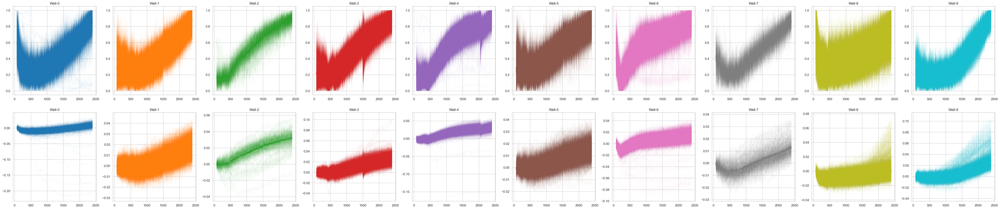

In [102]:
plot_curves(ori_ac_data)

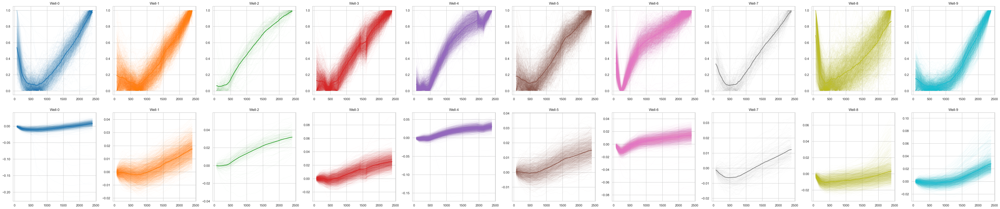

In [103]:
plot_curves(moving_avg_data)

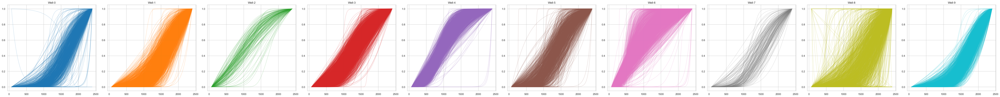

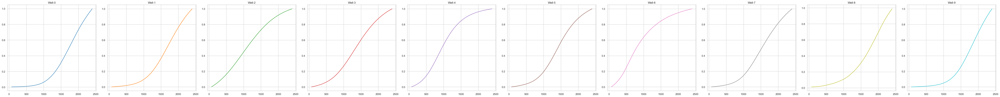

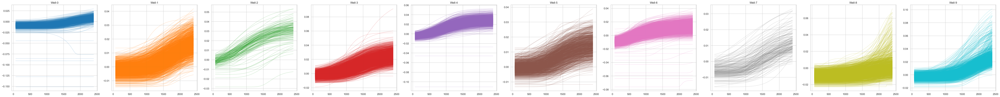

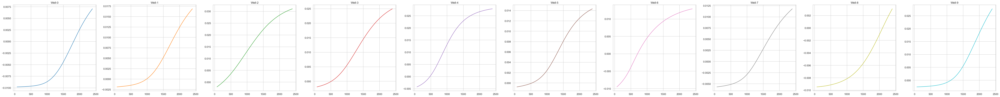

In [69]:
avgs = []
X = ori_curve["X_time"]

fig, ax = plt.subplots(1, 10, figsize=(60, 6))

for well in np.unique(ori_curve["Y_well"]):
    idx = np.where(ori_curve["Y_well"]==well)
    y = sigmoid_5p_data.filter(like='time_').values[idx]
    ax[well].plot(X, y.T, color=plt.cm.tab10(well), alpha=0.2)
    avgs.append(np.mean(y,axis=0))
    ax[well].set_title(f"Well-{well}")
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 10, figsize=(60, 6))
for i, well in enumerate(np.unique(ori_curve["Y_well"])):
    ax[well].plot(X, avgs[i].T, color=plt.cm.tab10(well), label=well)
    ax[well].set_title(f"Well-{well}")
plt.tight_layout()
plt.show()


avgs = []
X = ori_curve["X_time"]

fig, ax = plt.subplots(1, 10, figsize=(60, 6))

for well in np.unique(ori_curve["Y_well"]):
    idx = np.where(ori_curve["Y_well"]==well)
    y = denormalise_curve(sigmoid_5p_data).filter(like='time_').values[idx]
    ax[well].plot(X, y.T, color=plt.cm.tab10(well), alpha=0.2)
    avgs.append(np.mean(y,axis=0))
    ax[well].set_title(f"Well-{well}")
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 10, figsize=(60, 6))
for i, well in enumerate(np.unique(ori_curve["Y_well"])):
    ax[well].plot(X, avgs[i].T, color=plt.cm.tab10(well), label=well)
    ax[well].set_title(f"Well-{well}")

plt.tight_layout()
plt.show()


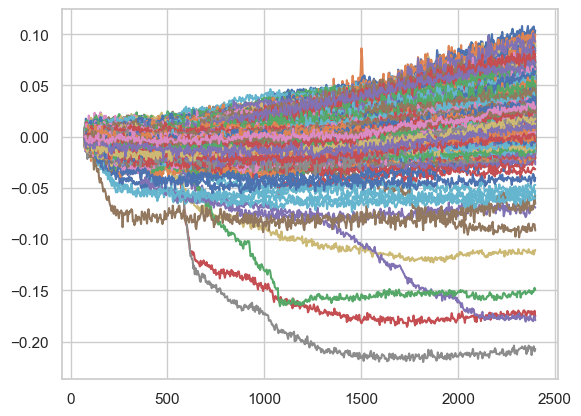

In [70]:
plt.plot(ori_curve["X_time"],ori_curve["ori"]["curves"].T)
plt.show()

In [6]:
ori_curve['ori']['features'].isna().sum()/ori_curve['ori']['features'].shape[0]*100

xms                           0.000000
xs                            0.000000
xe                            0.000000
xp1                           0.000000
xp2                           0.000000
TH                            0.000000
y_xms                         0.000000
y_xs                          0.000000
y_xe                          0.000000
y_xp1                         0.000000
y_xp2                         0.000000
dy_xms                        0.000000
dy_xp1                        0.000000
dy_xp2                        0.000000
d2y_xp1                       0.000000
d2y_xp2                       0.000000
threshold_distance            0.000000
first_half_distance           0.000000
second_half_distance          0.000000
distance_asymmetry_index      3.270524
peak_shifting_distance        0.000000
A1                            0.000000
A2                            0.000000
area_asymmetry_index          3.278825
peak_asymmetry_index          0.000000
Ct                       

In [72]:
def plot_nan_features_comparison(ori_curve, adj_curve, kf="log_F0", output_dir="."):
    """
    Plot curves with NaN features in 3x2 grid with statistics
    
    Parameters
    ----------
    ori_curve : dict
        Original processed curves
    adj_curve : dict
        Adjusted processed curves
    kf : str
        Feature key to filter NaN values
    output_dir : str
        Output directory to save plot
    """
    
    # Get NaN mask
    ori_nan_mask = ori_curve['sigmoid_5p']['features'][kf].isna()
    ori_n_nan = np.sum(ori_nan_mask)
    ori_n_total = len(ori_nan_mask)
    ori_nan_pct = (ori_n_nan / ori_n_total) * 100
    
    print(f"Plotting {ori_n_nan}/{ori_n_total} curves ({ori_nan_pct:.1f}%) with NaN in '{kf}'")

    adj_nan_mask = adj_curve['sigmoid_5p']['features'][kf].isna()
    adj_n_nan = np.sum(adj_nan_mask)
    adj_n_total = len(adj_nan_mask)
    adj_nan_pct = (adj_n_nan / adj_n_total) * 100

    print(f"Plotting {adj_n_nan}/{adj_n_total} curves ({adj_nan_pct:.1f}%) with NaN in '{kf}'")
    
    # ========================================================================
    # CREATE 3x2 FIGURE
    # ========================================================================
    
    fig, axes = plt.subplots(3, 2, figsize=(20, 16), sharex=True, sharey=True)
    
    X_time_ori = ori_curve["X_time"]
    X_time_adj = adj_curve["X_time"]
    
    curve_configurations = [
        {
            "title": "Original Curves",
            "ori_curves": ori_curve['ori']['curves'],
            "adj_curves": adj_curve['ori']['curves'],
            "ori_ax": axes[0, 0],
            "adj_ax": axes[0, 1],
        },
        {
            "title": "Moving Average",
            "ori_curves": ori_curve['moving_avg']['curves'],
            "adj_curves": adj_curve['moving_avg']['curves'],
            "ori_ax": axes[1, 0],
            "adj_ax": axes[1, 1],
        },
        {
            "title": "5PL Sigmoid Fitting",
            "ori_curves": ori_curve['sigmoid_5p']['curves'],
            "adj_curves": adj_curve['sigmoid_5p']['curves'],
            "ori_ax": axes[2, 0],
            "adj_ax": axes[2, 1],
        },
    ]
    
    for config in curve_configurations:
        # Original data
        nan_curves_ori = config['ori_curves'][ori_nan_mask]
        config['ori_ax'].plot(X_time_ori, np.transpose(nan_curves_ori), linewidth=1)#, color='#1f77b4')
        config['ori_ax'].set_xlabel('Time', fontsize=11, fontweight='bold')
        config['ori_ax'].set_ylabel('Response', fontsize=11, fontweight='bold')
        config['ori_ax'].set_title(f"{config['title']} - Original Data\n({ori_n_nan} curves)", 
                                   fontsize=12, fontweight='bold')
        config['ori_ax'].grid(True, alpha=0.3)
        
        # Adjusted data
        nan_curves_adj = config['adj_curves'][adj_nan_mask]
        config['adj_ax'].plot(X_time_adj, np.transpose(nan_curves_adj), linewidth=1)#, color='#ff7f0e')
        config['adj_ax'].set_xlabel('Time', fontsize=11, fontweight='bold')
        config['adj_ax'].set_ylabel('Response', fontsize=11, fontweight='bold')
        config['adj_ax'].set_title(f"{config['title']} - Adjusted Data\n({adj_n_nan} curves)", 
                                   fontsize=12, fontweight='bold')
        config['adj_ax'].grid(True, alpha=0.3)
    
    # ========================================================================
    # OVERALL TITLE & LAYOUT
    # ========================================================================
    
    fig.suptitle(f'Curves with NaN in {kf}', 
                fontsize=15, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    
    # # Save
    # output_path = f'{output_dir}/nan_features_comparison_{kf}.png'
    # plt.savefig(output_path, dpi=300, bbox_inches='tight')
    # print(f"✓ Plot saved: {output_path}")
    
    plt.show()

Plotting 9963/12047 curves (82.7%) with NaN in 'log_F0'
Plotting 0/12047 curves (0.0%) with NaN in 'log_F0'


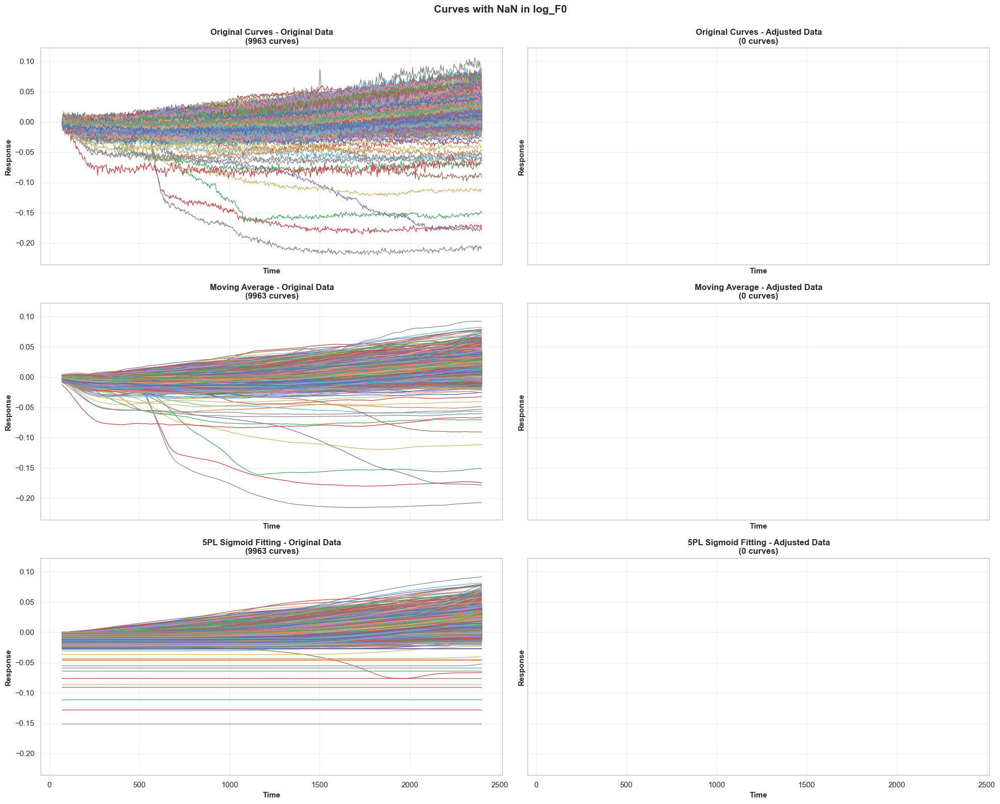

Plotting 18/12047 curves (0.1%) with NaN in 'xs'
Plotting 18/12047 curves (0.1%) with NaN in 'xs'


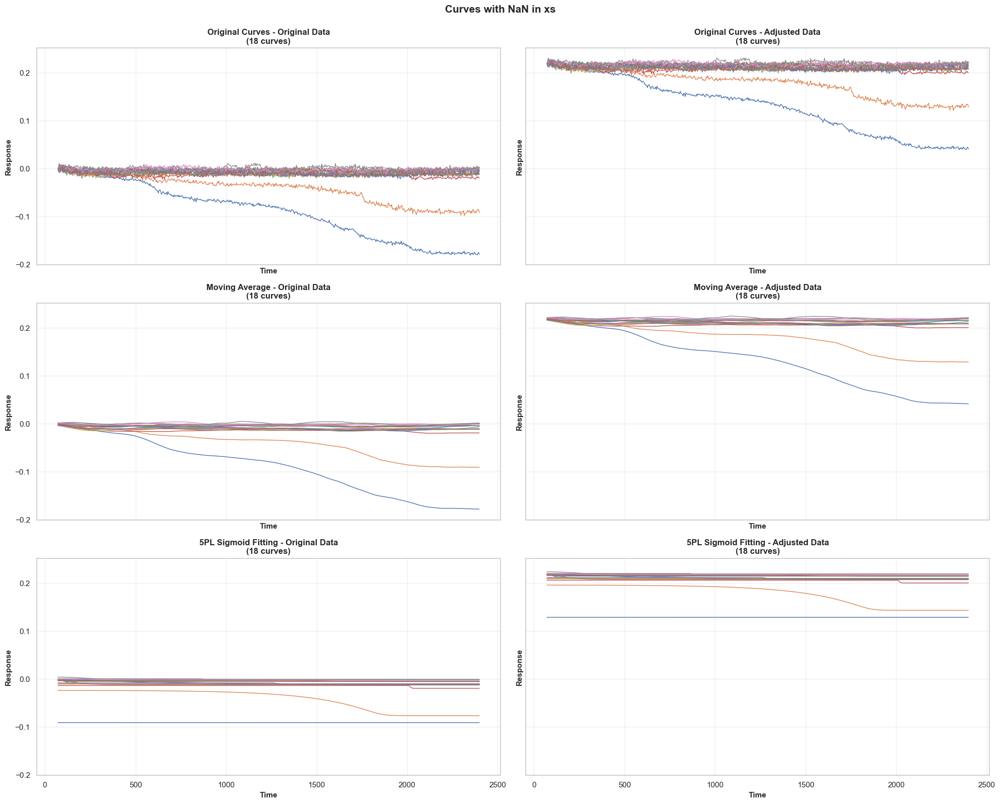

Plotting 18/12047 curves (0.1%) with NaN in 'xe'
Plotting 18/12047 curves (0.1%) with NaN in 'xe'


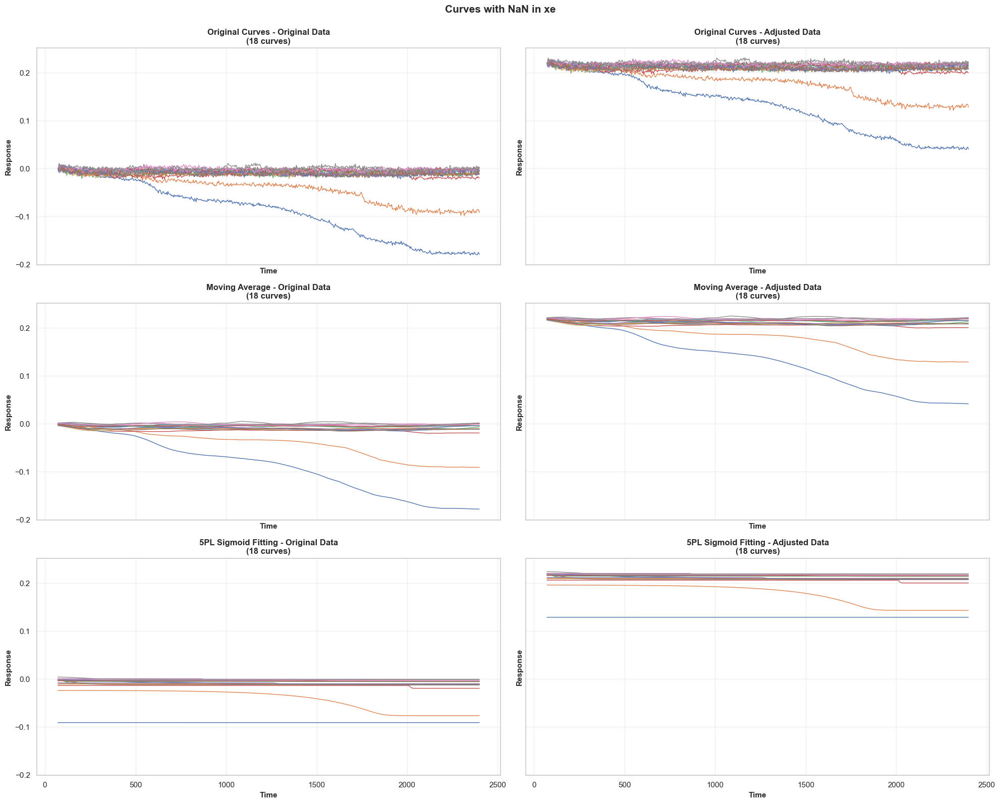

Plotting 1262/12047 curves (10.5%) with NaN in 'xp1'
Plotting 1254/12047 curves (10.4%) with NaN in 'xp1'


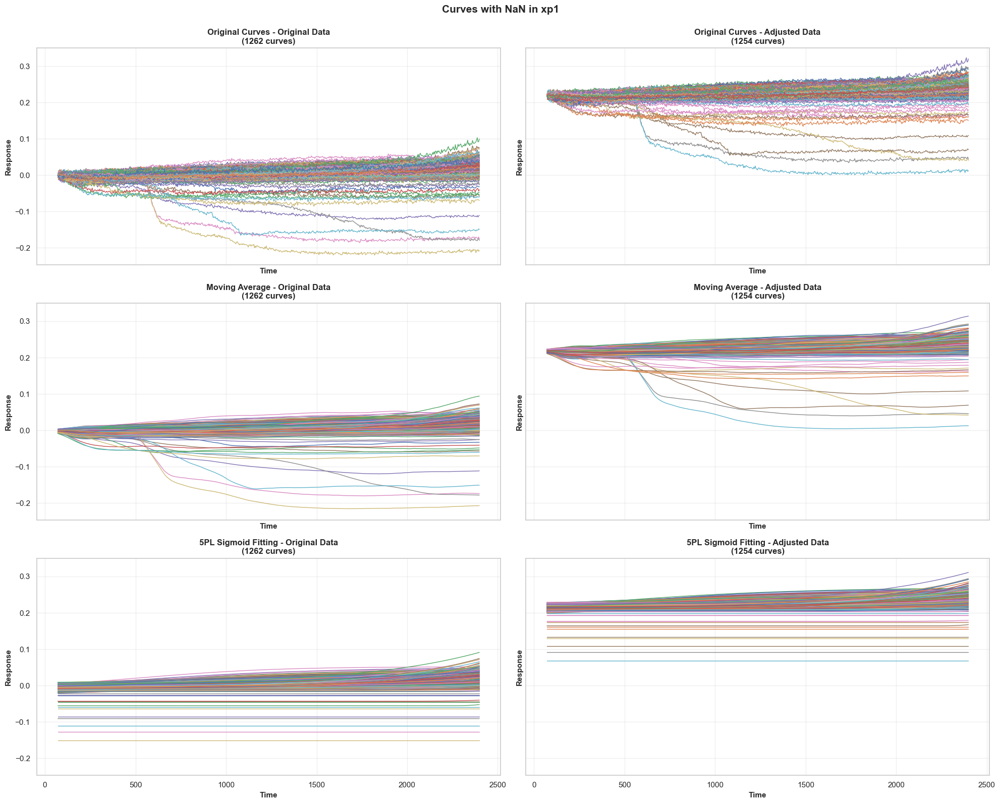

Plotting 2191/12047 curves (18.2%) with NaN in 'xp2'
Plotting 2185/12047 curves (18.1%) with NaN in 'xp2'


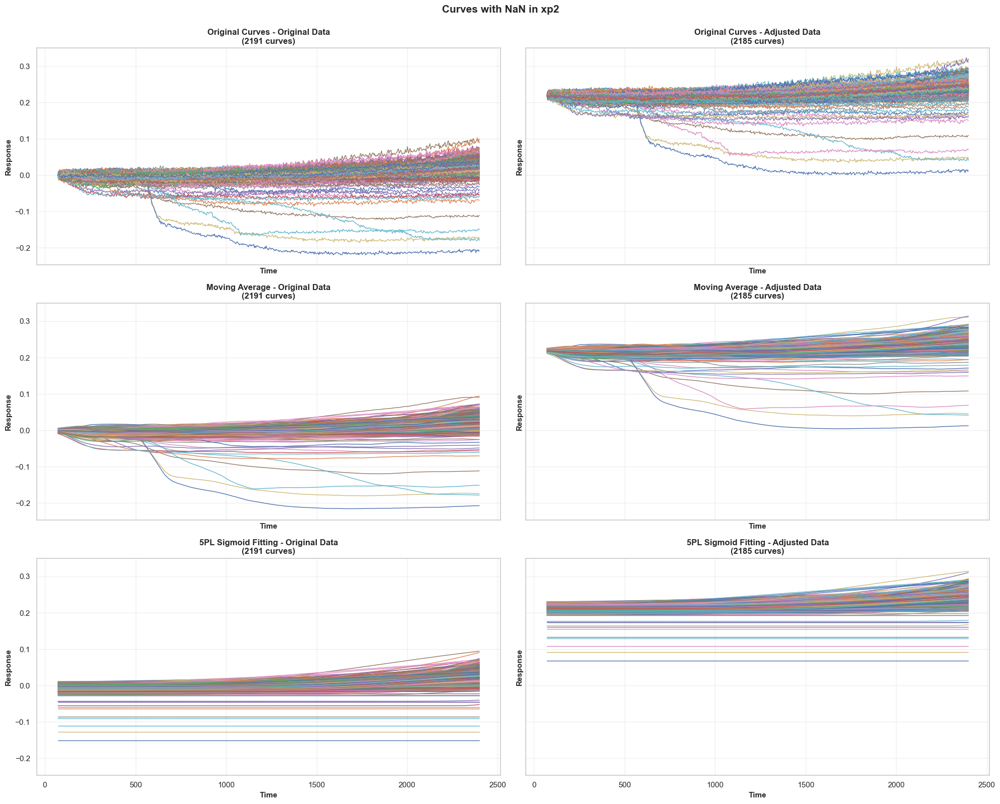

In [73]:
kfs = ["log_F0", "xs", "xe", "xp1", "xp2"]
for kf in kfs:
    plot_nan_features_comparison(ori_curve, adj_curve, kf=kf)

# plt.plot(ori_curve["X_time"], np.transpose(ori_curve['ori']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()
# plt.plot(adj_curve["X_time"], np.transpose(adj_curve['ori']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()

# plt.plot(ori_curve["X_time"], np.transpose(ori_curve['moving_avg']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()
# plt.plot(adj_curve["X_time"], np.transpose(adj_curve['moving_avg']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()

# plt.plot(ori_curve["X_time"], np.transpose(ori_curve['sigmoid_5p']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()
# plt.plot(adj_curve["X_time"], np.transpose(adj_curve['sigmoid_5p']['curves'][ori_curve['sigmoid_5p']['features'][kf].isna()]))
# plt.show()


In [74]:
adj_curve['sigmoid_5p']['features'].isna().sum()

xms                            0
xs                            18
xe                            18
xp1                         1254
xp2                         2185
TH                             0
y_xms                          0
y_xs                          18
y_xe                          18
y_xp1                       1254
y_xp2                       2185
dy_xms                         0
dy_xp1                      1254
dy_xp2                      2185
d2y_xp1                     1254
d2y_xp2                     2185
threshold_distance            18
first_half_distance           18
second_half_distance          18
distance_asymmetry_index     254
peak_shifting_distance      3006
A1                            18
A2                            18
area_asymmetry_index         254
peak_asymmetry_index        3006
Ct                             0
Cy0                            0
log_F0                         0
dtype: int64

In [75]:
adj_curve['sigmoid_5p']['features'].corr()

,xms,xs,xe,xp1,xp2,TH,y_xms,y_xs,y_xe,y_xp1,...,second_half_distance,distance_asymmetry_index,peak_shifting_distance,A1,A2,area_asymmetry_index,peak_asymmetry_index,Ct,Cy0,log_F0
xms,1.000000,0.544426,0.368635,0.911610,0.874632,-0.004476,0.314801,0.088138,-0.122015,0.239258,...,-0.903962,-0.171812,-0.038694,0.390497,-0.717159,-0.170811,-0.192506,0.821760,-0.237423,-0.060076
xs,0.544426,1.000000,0.113231,0.688621,0.499064,0.129662,-0.234708,-0.197965,-0.422108,-0.260356,...,-0.532374,-0.062107,-0.436416,-0.179884,-0.425580,-0.053970,0.207563,0.875300,-0.217541,0.207533
xe,0.368635,0.113231,1.000000,0.303250,0.578862,-0.323578,0.145833,0.106406,0.133344,0.130643,...,0.064266,0.003414,0.519614,0.124944,0.024831,0.009957,0.059749,0.323236,-0.004552,-0.094466
xp1,0.911610,0.688621,0.303250,1.000000,0.747973,0.036827,0.104162,-0.002116,-0.224269,0.220221,...,-0.869316,-0.742413,-0.386602,0.153552,-0.643208,-0.653261,-0.214299,0.855429,-0.341090,0.018111
xp2,0.874632,0.499064,0.578862,0.747973,1.000000,-0.202303,0.222343,0.175637,-0.047633,0.197143,...,-0.588600,-0.093152,0.322954,0.186869,-0.401170,-0.070255,-0.148871,0.767837,-0.030415,-0.165054
TH,-0.004476,0.129662,-0.323578,0.036827,-0.202303,1.000000,0.315172,0.049175,0.335885,0.180549,...,-0.144479,-0.010210,-0.323301,0.411295,0.144499,-0.017041,-0.053212,0.056658,-0.427086,-0.035982
y_xms,0.314801,-0.234708,0.145833,0.104162,0.222343,0.315172,1.000000,0.742062,0.843136,0.911667,...,-0.277221,-0.090047,0.273433,0.846825,0.037848,-0.094257,-0.394808,0.025913,-0.136073,-0.711978
y_xs,0.088138,-0.197965,0.106406,-0.002116,0.175637,0.049175,0.742062,1.000000,0.649384,0.831241,...,-0.045671,-0.037182,0.173913,0.271867,0.072176,-0.032349,-0.161424,-0.038571,0.221696,-0.985199
y_xe,-0.122015,-0.422108,0.133344,-0.224269,-0.047633,0.335885,0.843136,0.649384,1.000000,0.722408,...,0.192327,0.005591,0.342821,0.695165,0.569226,0.003094,-0.194297,-0.291011,-0.011277,-0.627553
y_xp1,0.239258,-0.260356,0.130643,0.220221,0.197143,0.180549,0.911667,0.831241,0.722408,1.000000,...,-0.199548,-0.384614,0.086690,0.649107,0.047797,-0.455027,-0.474602,-0.046634,-0.057557,-0.821323


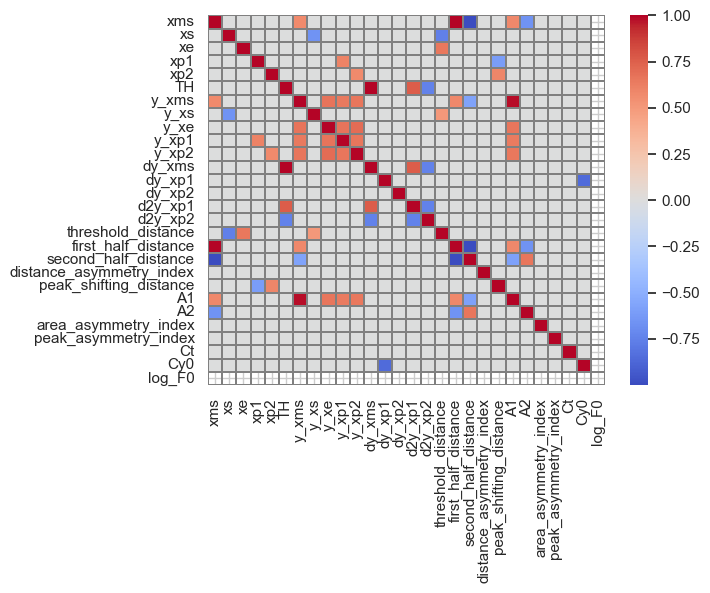

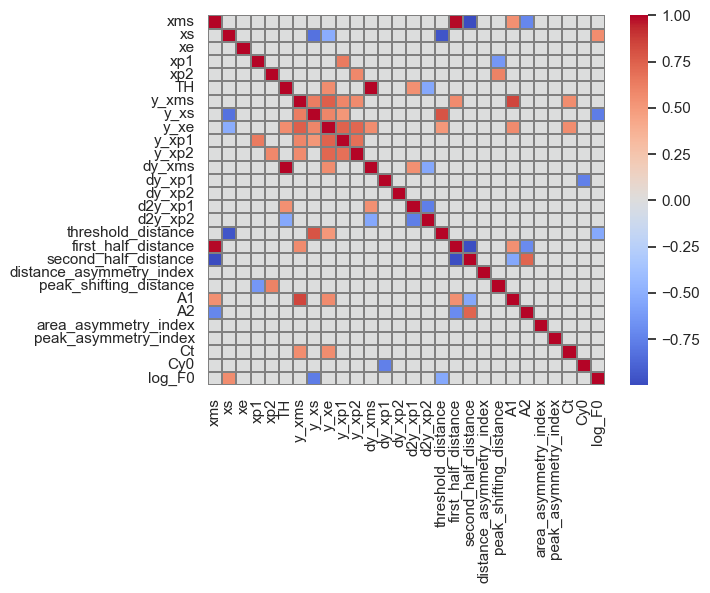

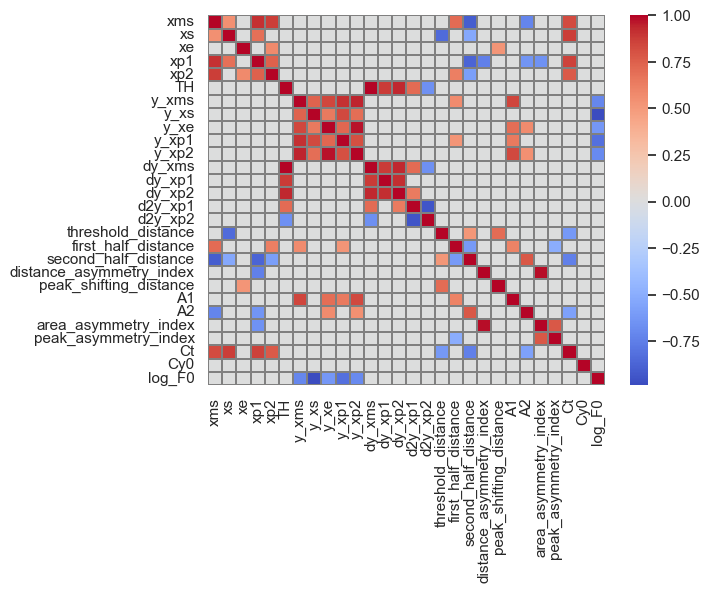

In [76]:
import seaborn as sns

corr = adj_curve["ori"]['features'].corr()
corr = corr.mask(corr.abs() < 0.5, 0)
sns.heatmap(corr, cmap="coolwarm", xticklabels=True, yticklabels=True, linewidths=0.01, linecolor='grey')
plt.show()

corr = adj_curve["moving_avg"]['features'].corr()
corr = corr.mask(corr.abs() < 0.5, 0)
sns.heatmap(corr, cmap="coolwarm", xticklabels=True, yticklabels=True, linewidths=0.01, linecolor='grey')
plt.show()

corr = adj_curve["sigmoid_5p"]['features'].corr()
corr = corr.mask(corr.abs() < 0.5, 0)
sns.heatmap(corr, cmap="coolwarm", xticklabels=True, yticklabels=True, linewidths=0.01, linecolor='grey')
plt.show()


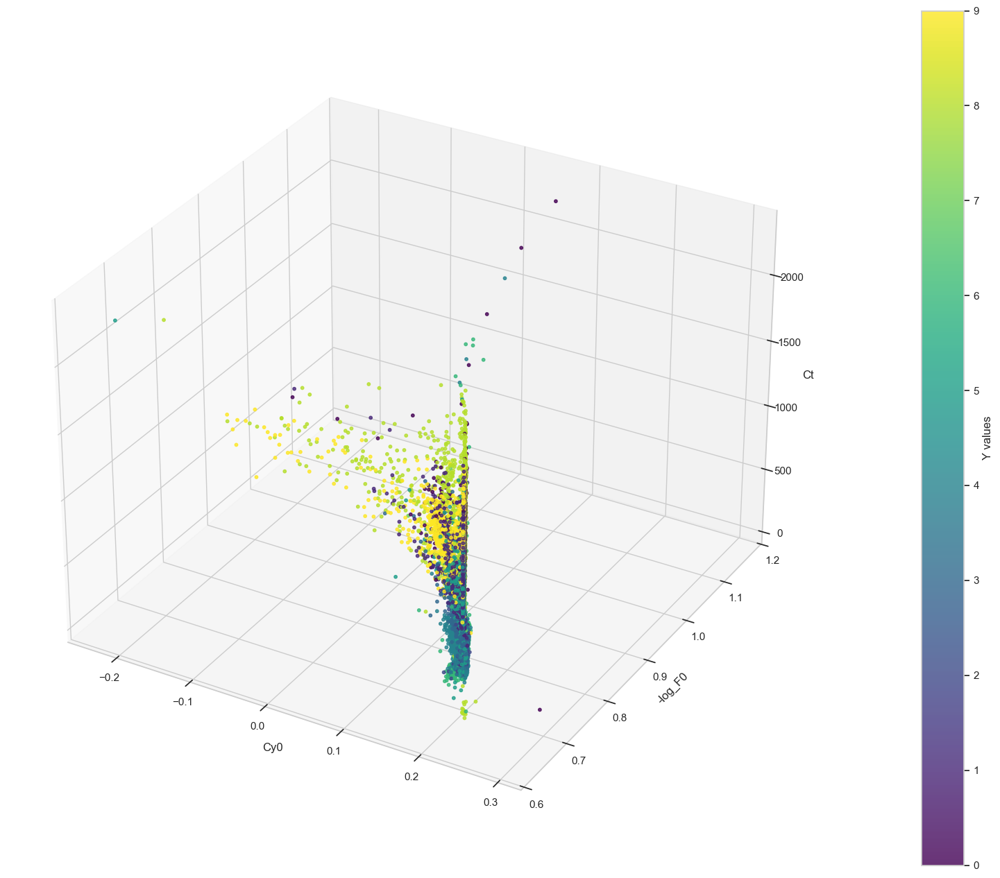

In [77]:

X_outlier_features = adj_curve['sigmoid_5p']['features'][['Ct', 'Cy0', 'log_F0']].values
y_outlier_labels = adj_curve["Y_well"]


fig = plt.figure(figsize=(20, 16))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_outlier_features[:, 1], X_outlier_features[:, 2], X_outlier_features[:, 0], c=y_outlier_labels, cmap='viridis', s=10, alpha=0.8)

ax.set_zlabel('Ct')
ax.set_xlabel('Cy0')
ax.set_ylabel('-log_F0')

cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Y values')

plt.show()


[ 1.00000000e+00 -1.17910841e-05  9.82397963e-06]
702.8112649621179


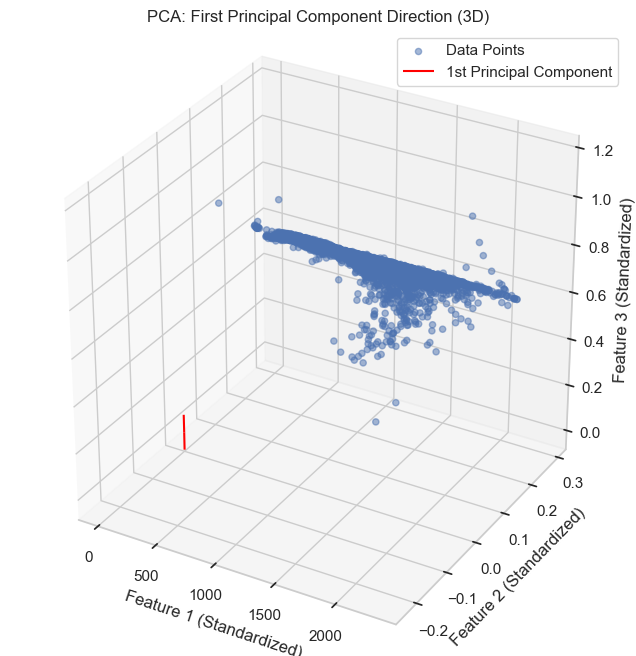

In [78]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.9)
pca = pca.fit(X_outlier_features[np.where(y_outlier_labels == 1)])
pc1 = pca.components_[0]

# 1. Set up the figure and 3D axis
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# 2. Plot the 3D scatter points
ax.scatter(X_outlier_features[:, 0], 
           X_outlier_features[:, 1], 
           X_outlier_features[:, 2], 
           alpha=0.5, label='Data Points')

# 3. Plot the direction vector using quiver
# We scale the vector by the square root of its explained variance for visualization
scale = np.sqrt(pca.explained_variance_[0]) * 3
print(pc1)
print(scale)
scale = 1
# ax.quiver(X, Y, Z, U, V, W) draws an arrow from (X,Y,Z) in direction (U,V,W)
ax.quiver(0, 0, 0, 
          pc1[0]*scale, pc1[1]*scale, pc1[2]*scale, 
          color='red', label='1st Principal Component')

# 4. Formatting
ax.set_title('PCA: First Principal Component Direction (3D)')
ax.set_xlabel('Feature 1 (Standardized)')
ax.set_ylabel('Feature 2 (Standardized)')
ax.set_zlabel('Feature 3 (Standardized)')

# Force equal aspect ratio to visualize perpendicularity/angles correctly
# (Works in matplotlib >= 3.3)
try:
    ax.set_box_aspect((1, 1, 1))
except AttributeError:
    pass # Fallback for older versions

plt.legend()
plt.show()

# fig, ax = plt.subplots(figsize=(12, 9))
# colors = plt.cm.tab10(np.arange(n_wells))

# for label in range(n_wells):
#     mask = y_outlier_labels == label
#     ax.scatter(out_pca[mask, 0], out_pca[mask, 1],
#               alpha=0.7, s=20, c=[colors[label]], 
#               label=f'Well-{label+1} (n={np.sum(mask)})',
#               edgecolors='black', linewidth=0.5)

# ax.set_xlabel('PCA 1', fontsize=12, fontweight='bold')
# ax.set_ylabel('PCA 2', fontsize=12, fontweight='bold')
# ax.set_title('PCA Visualization - Moving Average (25)', fontsize=14, fontweight='bold')
# ax.grid(True, alpha=0.3)
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)

# plt.tight_layout()
# plt.show()

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def unsupervised_line_fitting(features, method='pca', output_dir=".", plot_3d=True, filename="line_fitting"):
    """
    Fit 1D line to multidimensional features (MSC)
    """
    print("=" * 60)
    # print("Unsupervised 1D Line Fitting (MSC)")
    print(filename)
    print("=" * 60)
    
    # ========================================================================
    # PREPARE DATA
    # ========================================================================
    
    if isinstance(features, pd.DataFrame):
        feature_names = features.columns.tolist()
        X = features.values
    else:
        X = np.asarray(features)
        feature_names = [f"Feature-{i}" for i in range(X.shape[1])]
    
    # Remove NaN
    nan_mask = np.any(np.isnan(X), axis=1)
    X_clean = X[~nan_mask]
    
    print(f"Data shape: {X_clean.shape}")
    print(f"Features: {feature_names}")
    print(f"Samples removed (NaN): {np.sum(nan_mask)}")
    print("-" * 60)
    # Standardize for PCA and RANSAC
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_clean)
    
    results = {}
    
    # ========================================================================
    # METHOD 1: PCA (On Scaled Data)
    # ========================================================================
    
    # print(f"\n{'-'*60}")
    # print("METHOD 1: PCA (First Principal Component, Scaled Data)")
    # print(f"{'-'*60}")
    
    pca = PCA(n_components=1)
    # X_pca = pca.fit_transform(X_scaled)
    X_pca = pca.fit_transform(X_clean)
    direction_pca = pca.components_[0]
    projections_pca = X_pca.ravel()
    X_line_pca = projections_pca[:, np.newaxis] @ direction_pca[np.newaxis, :]
    # X_line_pca_original = scaler.inverse_transform(X_line_pca)
    X_line_pca_original = X_line_pca
    residuals_pca = np.linalg.norm(X_clean - X_line_pca_original, axis=1)
    
    results['pca'] = {
        'method': 'PCA',
        'direction': direction_pca,
        'projections': projections_pca,
        'line_points': X_line_pca_original,
        'residuals': residuals_pca,
        'mse': np.mean(residuals_pca**2),
        'rmse': np.sqrt(np.mean(residuals_pca**2)),
    }
    
    print(f"PCA RMSE: {results['pca']['rmse']:.4f}")
    
    # ========================================================================
    # METHOD 2: Least Squares (On Unscaled Data)
    # ========================================================================
    
    # print(f"\n{'-'*60}")
    # print("METHOD 2: Least Squares Line Fitting (SVD, Unscaled Data)")
    # print(f"{'-'*60}")
    
    mean_X = X_clean.mean(axis=0)
    X_centered = X_clean - mean_X
    U, S, Vt = np.linalg.svd(X_centered, full_matrices=False)
    direction_ls = Vt[0, :]
    projections_ls = X_centered @ direction_ls
    X_line_ls = projections_ls[:, np.newaxis] @ direction_ls[np.newaxis, :]
    X_line_ls_original = X_line_ls + mean_X
    residuals_ls = np.linalg.norm(X_clean - X_line_ls_original, axis=1)
    
    results['least_squares'] = {
        'method': 'Least Squares (SVD)',
        'direction': direction_ls,
        'projections': projections_ls,
        'line_points': X_line_ls_original,
        'residuals': residuals_ls,
        'mse': np.mean(residuals_ls**2),
        'rmse': np.sqrt(np.mean(residuals_ls**2)),
    }
    
    print(f"Least Squares Line Fitting RMSE: {results['least_squares']['rmse']:.4f}")
    
    # ========================================================================
    # METHOD 3: RANSAC (Proper robust regression with correct math)
    # ========================================================================
    
    # print(f"\n{'-'*60}")
    # print("METHOD 3: RANSAC Line Fitting (Scaled Data)")
    # print(f"{'-'*60}")
    
    # RANSAC approach: fit multiple random lines and keep the one with most inliers
    n_iterations = 100
    threshold = np.percentile(residuals_pca, 75)  # Use 75th percentile as threshold
    
    best_num_inliers = 0
    best_direction_ransac = direction_pca
    # best_inlier_mask = np.ones(len(X_scaled), dtype=bool)
    best_inlier_mask = np.ones(len(X_clean), dtype=bool)
    
    np.random.seed(42)
    
    for iteration in range(n_iterations):
        # Randomly select minimum samples (2 points for 1D line in nD)
        # sample_indices = np.random.choice(len(X_scaled), size=2, replace=False)
        sample_indices = np.random.choice(len(X_clean), size=2, replace=False)
        
        # Fit line through these 2 points
        # point1 = X_scaled[sample_indices[0]]
        # point2 = X_scaled[sample_indices[1]]
        point1 = X_clean[sample_indices[0]]
        point2 = X_clean[sample_indices[1]]
        
        # Direction vector
        direction_candidate = point2 - point1
        direction_candidate = direction_candidate / np.linalg.norm(direction_candidate)
        
        # Project all points onto this line (anchoring at point1)
        # X_shifted = X_scaled - point1
        X_shifted = X_clean - point1
        projections_candidate = X_shifted @ direction_candidate
        
        # Reconstruct line points in standardized space
        X_line_candidate = point1 + (projections_candidate[:, np.newaxis] * direction_candidate)
        
        # Calculate residuals
        # residuals_candidate = np.linalg.norm(X_scaled - X_line_candidate, axis=1)
        residuals_candidate = np.linalg.norm(X_clean - X_line_candidate, axis=1)
        
        # Count inliers
        inlier_mask_candidate = residuals_candidate < threshold
        num_inliers = np.sum(inlier_mask_candidate)
        
        # Keep best model
        if num_inliers > best_num_inliers:
            best_num_inliers = num_inliers
            best_direction_ransac = direction_candidate
            best_inlier_mask = inlier_mask_candidate
    
    # Refit on best inliers using PCA
    pca_inliers = PCA(n_components=1)
    # pca_inliers.fit(X_scaled[best_inlier_mask])
    pca_inliers.fit(X_clean[best_inlier_mask])
    direction_ransac = pca_inliers.components_[0]
    
    # Final projections and residuals
    # projections_ransac = X_scaled @ direction_ransac
    projections_ransac = X_clean @ direction_ransac
    X_line_ransac = projections_ransac[:, np.newaxis] @ direction_ransac[np.newaxis, :]
    # X_line_ransac_original = scaler.inverse_transform(X_line_ransac)
    X_line_ransac_original = X_line_ransac
    residuals_ransac = np.linalg.norm(X_clean - X_line_ransac_original, axis=1)
    
    results['ransac'] = {
        'method': 'RANSAC',
        'direction': direction_ransac,
        'projections': projections_ransac,
        'line_points': X_line_ransac_original,
        'residuals': residuals_ransac,
        # 'inlier_ratio': best_num_inliers / len(X_scaled),
        'inlier_ratio': best_num_inliers / len(X_clean),
        'num_inliers': best_num_inliers,
        'mse': np.mean(residuals_ransac**2),
        'rmse': np.sqrt(np.mean(residuals_ransac**2)),
    }
    
    # print(f"Iterations: {n_iterations}")
    # # print(f"Inliers found: {best_num_inliers}/{len(X_scaled)} ({results['ransac']['inlier_ratio']*100:.1f}%)")
    # print(f"Inliers found: {best_num_inliers}/{len(X_clean)} ({results['ransac']['inlier_ratio']*100:.1f}%)")
    print(f"RANSAC RMSE: {results['ransac']['rmse']:.4f}")
    
    # ========================================================================
    # CREATE 3x3 VISUALIZATION
    # ========================================================================
    
    # print(f"\n{'-'*60}")
    # print("Creating 3x3 visualization...")
    # print(f"{'-'*60}")
    
    methods = ['pca', 'least_squares', 'ransac']
    method_names = ['PCA', 'Least Squares', 'RANSAC']
    line_colors = ['blue', 'green', 'purple']  # Added distinct colors for each method
    
    fig = plt.figure(figsize=(20, 16))
    
    for col_idx, (method_key, method_name, line_color) in enumerate(zip(methods, method_names, line_colors)):
        result = results[method_key]
        residuals = result['residuals']
        projections = result['projections']
        line_points = result['line_points']
        
        # ====================================================================
        # ROW 1: Residuals Histogram
        # ====================================================================
        
        ax_hist = plt.subplot(3, 3, col_idx + 1)
        ax_hist.hist(residuals, bins=50, alpha=0.7, color='steelblue', edgecolor='black')
        ax_hist.axvline(np.mean(residuals), color='red', linestyle='--', linewidth=2.5,
                       label=f'Mean: {np.mean(residuals):.4f}')
        ax_hist.axvline(np.median(residuals), color='green', linestyle='--', linewidth=2.5,
                       label=f'Median: {np.median(residuals):.4f}')
        
        ax_hist.set_xlabel('Residual (Distance from Line)', fontsize=11, fontweight='bold')
        ax_hist.set_ylabel('Frequency', fontsize=11, fontweight='bold')
        ax_hist.set_title(f'{method_name} - Residuals\nRMSE: {result["rmse"]:.4f}',
                         fontsize=12, fontweight='bold')
        ax_hist.grid(True, alpha=0.3, axis='y')
        ax_hist.legend(fontsize=10)
        
        # ====================================================================
        # ROW 2: Projection onto Line
        # ====================================================================
        
        ax_proj = plt.subplot(3, 3, col_idx + 4)
        scatter = ax_proj.scatter(projections, residuals, 
                                 c=residuals, cmap='RdYlGn_r', s=50, alpha=0.7,
                                 edgecolors='black', linewidth=0.5)
        
        ax_proj.set_xlabel('Projection on Line', fontsize=11, fontweight='bold')
        ax_proj.set_ylabel('Residual', fontsize=11, fontweight='bold')
        ax_proj.set_title(f'{method_name} - Projection',
                         fontsize=12, fontweight='bold')
        ax_proj.grid(True, alpha=0.3)
        
        cbar = plt.colorbar(scatter, ax=ax_proj)
        cbar.set_label('Residual', fontsize=10, fontweight='bold')
        
        # ====================================================================
        # ROW 3: 3D Visualization
        # ====================================================================
        
        if X_clean.shape[1] >= 3:
            ax_3d = plt.subplot(3, 3, col_idx + 7, projection='3d')
            
            scatter_3d = ax_3d.scatter(X_clean[:, 0], X_clean[:, 1], X_clean[:, 2],
                                      c=residuals, cmap='RdYlGn_r',
                                      s=30, alpha=0.6, edgecolors='black', linewidth=0.5)
            
            direction = result['direction']
            projections_line = (line_points - line_points.mean(axis=0)) @ direction
            sort_idx = np.argsort(projections_line)
            line_points_sorted = line_points[sort_idx]
            
            # Using the distinct color mapped to the method
            ax_3d.plot(line_points_sorted[:, 0], line_points_sorted[:, 1], 
                      line_points_sorted[:, 2], color=line_color, linewidth=3.5, label='Fitted Line')
            
            ax_3d.set_xlabel(feature_names[0], fontsize=10, fontweight='bold')
            ax_3d.set_ylabel(feature_names[1], fontsize=10, fontweight='bold')
            ax_3d.set_zlabel(feature_names[2], fontsize=10, fontweight='bold')
            ax_3d.set_title(f'{method_name} - 3D',
                           fontsize=12, fontweight='bold')
            ax_3d.legend(fontsize=10)
            ax_3d.view_init(elev=20, azim=45)
    
    fig.suptitle('1D Line Fitting - PCA vs Least Squares vs RANSAC', 
                fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    output_path = f'{output_dir}/{filename}.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    # print(f"✓ Plot saved: {output_path}")
    plt.close()
    
    # ========================================================================
    # NEW: COMBINED 3D VISUALIZATION
    # ========================================================================
    
    if plot_3d and X_clean.shape[1] >= 3:
        # print(f"\n{'-'*60}")
        # print("Creating combined 3D visualization...")
        # print(f"{'-'*60}")
        
        fig_3d = plt.figure(figsize=(12, 10))
        ax_all = fig_3d.add_subplot(111, projection='3d')
        
        # Plot the original data points
        ax_all.scatter(X_clean[:, 0], X_clean[:, 1], X_clean[:, 2],
                                      c="grey", s=30, alpha=0.6, edgecolors='black', linewidth=0.5)
        # Overlay all three fitted lines
        for method_key, method_name, line_color in zip(methods, method_names, line_colors):
            result = results[method_key]
            line_points = result['line_points']
            direction = result['direction']
            
            # Sort the line points for a smooth continuous line
            projections_line = (line_points - line_points.mean(axis=0)) @ direction
            sort_idx = np.argsort(projections_line)
            line_points_sorted = line_points[sort_idx]
            
            ax_all.plot(line_points_sorted[:, 0], line_points_sorted[:, 1], line_points_sorted[:, 2], 
                        color=line_color, linewidth=4, label=f"{method_name} Line")

        ax_all.set_xlabel(feature_names[0], fontsize=12, fontweight='bold')
        ax_all.set_ylabel(feature_names[1], fontsize=12, fontweight='bold')
        ax_all.set_zlabel(feature_names[2], fontsize=12, fontweight='bold')
        ax_all.set_title('Combined 3D Visualization of All Fitted Lines', fontsize=16, fontweight='bold')
        
        # Create a legend
        leg = ax_all.legend(fontsize=12, markerscale=2)
        # Set line transparency in legend to fully opaque
        for legobj in leg.legend_handles:
            legobj.set_alpha(1.0)
            
        ax_all.view_init(elev=20, azim=45)
        
        output_path_3d = f'{output_dir}/{filename}_Combined_3D.png'
        plt.savefig(output_path_3d, dpi=300, bbox_inches='tight')
        # print(f"✓ Combined 3D Plot saved: {output_path_3d}")
        plt.close()

    # ========================================================================
    # SUMMARY
    # ========================================================================
    
    # print(f"\n{'='*60}")
    # print("SUMMARY STATISTICS")
    # print(f"{'='*60}")
    
    summary_data = []
    for method_key, method_name in zip(methods, method_names):
        result = results[method_key]
        summary_data.append({
            'Method': method_name,
            'RMSE': f"{result['rmse']:.6f}",
            'MSE': f"{result['mse']:.6f}",
            'Mean Res': f"{np.mean(result['residuals']):.6f}",
            'Median Res': f"{np.median(result['residuals']):.6f}",
            'Max Res': f"{np.max(result['residuals']):.6f}",
        })
    
    df_summary = pd.DataFrame(summary_data)
    # print(df_summary.to_string(index=False))
    
    df_summary.to_csv(f'{output_dir}/{filename}.csv', index=False)
    # print(f"✓ Summary saved")
    
    return results

In [80]:
line_fittings = []
for well in range(n_wells):
    features = X_outlier_features[np.where(y_outlier_labels == well)]
    results = unsupervised_line_fitting(
        features,
        method='pca',
        output_dir=exp_path,
        plot_3d=True,
        filename=f'line_fitting-well_{well}'
    )
    line_fittings.append(results)
    

line_fitting-well_0
Data shape: (818, 3)
Features: ['Feature-0', 'Feature-1', 'Feature-2']
Samples removed (NaN): 0
------------------------------------------------------------
PCA RMSE: 1353.6427
Least Squares Line Fitting RMSE: 0.0290
RANSAC RMSE: 0.6852
line_fitting-well_1
Data shape: (1656, 3)
Features: ['Feature-0', 'Feature-1', 'Feature-2']
Samples removed (NaN): 0
------------------------------------------------------------
PCA RMSE: 1257.0831
Least Squares Line Fitting RMSE: 0.0146
RANSAC RMSE: 0.6886
line_fitting-well_2
Data shape: (140, 3)
Features: ['Feature-0', 'Feature-1', 'Feature-2']
Samples removed (NaN): 0
------------------------------------------------------------
PCA RMSE: 612.9866
Least Squares Line Fitting RMSE: 0.0106
RANSAC RMSE: 0.6853
line_fitting-well_3
Data shape: (1747, 3)
Features: ['Feature-0', 'Feature-1', 'Feature-2']
Samples removed (NaN): 0
------------------------------------------------------------
PCA RMSE: 892.7423
Least Squares Line Fitting RMSE:

In [81]:
line_fittings[0]["least_squares"]['direction']

array([ 9.99999999e-01, -2.10994546e-05,  2.59858694e-05])

In [82]:
X_outlier_features[np.where(y_outlier_labels == 0)][0] @ line_fittings[0]["least_squares"]['direction']

np.float64(1141.650394749424)

In [83]:
X_clean_temp = X_outlier_features[np.where(y_outlier_labels == 0)]
mean_X_temp = X_clean_temp.mean(axis=0)
    
X_centered_temp = X_clean_temp - mean_X_temp
U_temp, S_temp, Vt_temp = np.linalg.svd(X_centered_temp, full_matrices=False)
direction_ls_temp = Vt_temp[0, :]

In [84]:
print(X_clean_temp.shape)
print(U_temp.shape)
print(S_temp.shape)
print(Vt_temp.shape)
print(S_temp)

(818, 3)
(818, 3)
(3,)
(3, 3)
[6.55677073e+03 7.42926970e-01 3.70619093e-01]


In [85]:
Vt_temp

array([[ 9.99999999e-01, -2.10994546e-05,  2.59858694e-05],
       [-3.21645437e-05, -3.90752087e-01,  9.20495956e-01],
       [ 9.26792990e-06,  9.20495957e-01,  3.90752087e-01]])

In [86]:
mean_X_temp

array([1.35364247e+03, 2.06375801e-01, 6.78208854e-01])

In [87]:
X_clean_temp

array([[ 1.14165038e+03,  2.14804124e-01,  6.58216693e-01],
       [ 2.09032221e+03,  1.44883165e-01,  6.77791849e-01],
       [ 1.92152039e+03, -1.60293767e-02,  6.90877305e-01],
       ...,
       [ 7.11000000e+01,  2.91288643e-01,  7.07110325e-01],
       [ 1.60049406e+03,  2.01941262e-01,  6.94401692e-01],
       [ 2.25795466e+03,  6.25960827e-02,  1.16372222e+00]],
      shape=(818, 3))

In [88]:
X_centered_temp

array([[-2.11992082e+02,  8.42832250e-03, -1.99921603e-02],
       [ 7.36679749e+02, -6.14926365e-02, -4.17005104e-04],
       [ 5.67877928e+02, -2.22405178e-01,  1.26684509e-02],
       ...,
       [-1.28254247e+03,  8.49128416e-02,  2.89014716e-02],
       [ 2.46851597e+02, -4.43453911e-03,  1.61928382e-02],
       [ 9.04312191e+02, -1.43779718e-01,  4.85513363e-01]],
      shape=(818, 3))

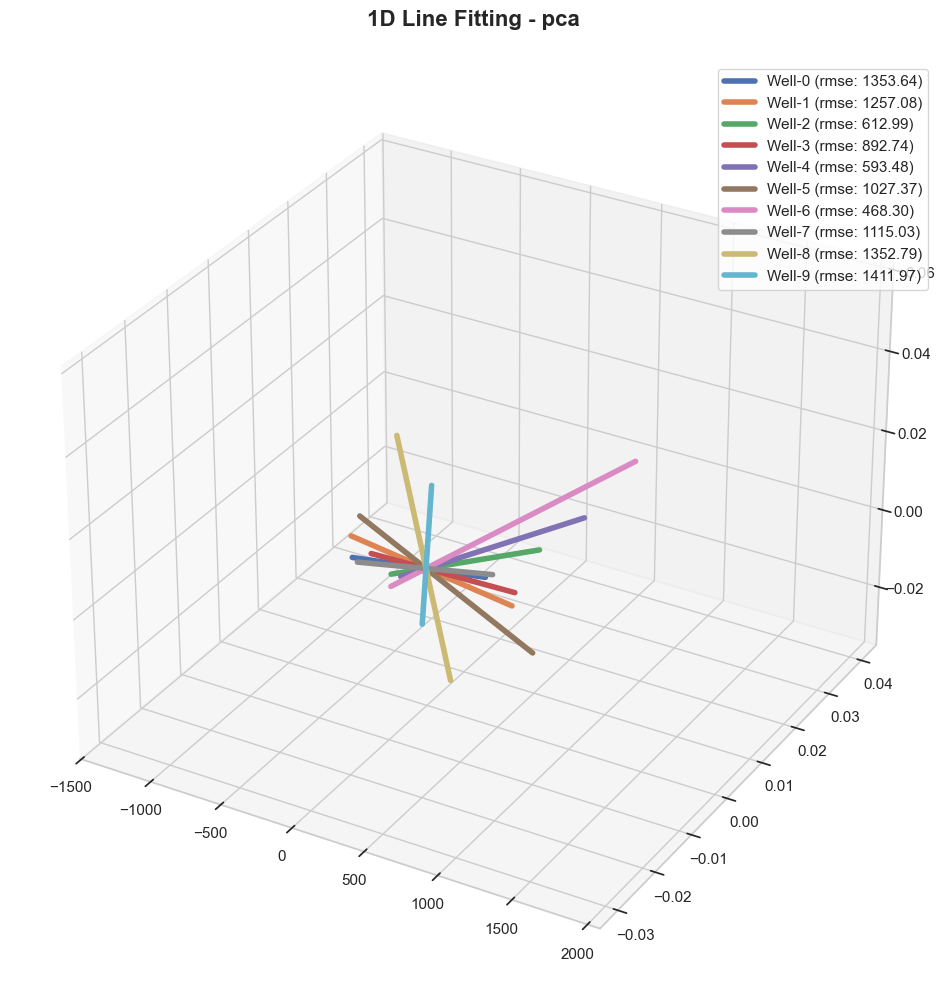

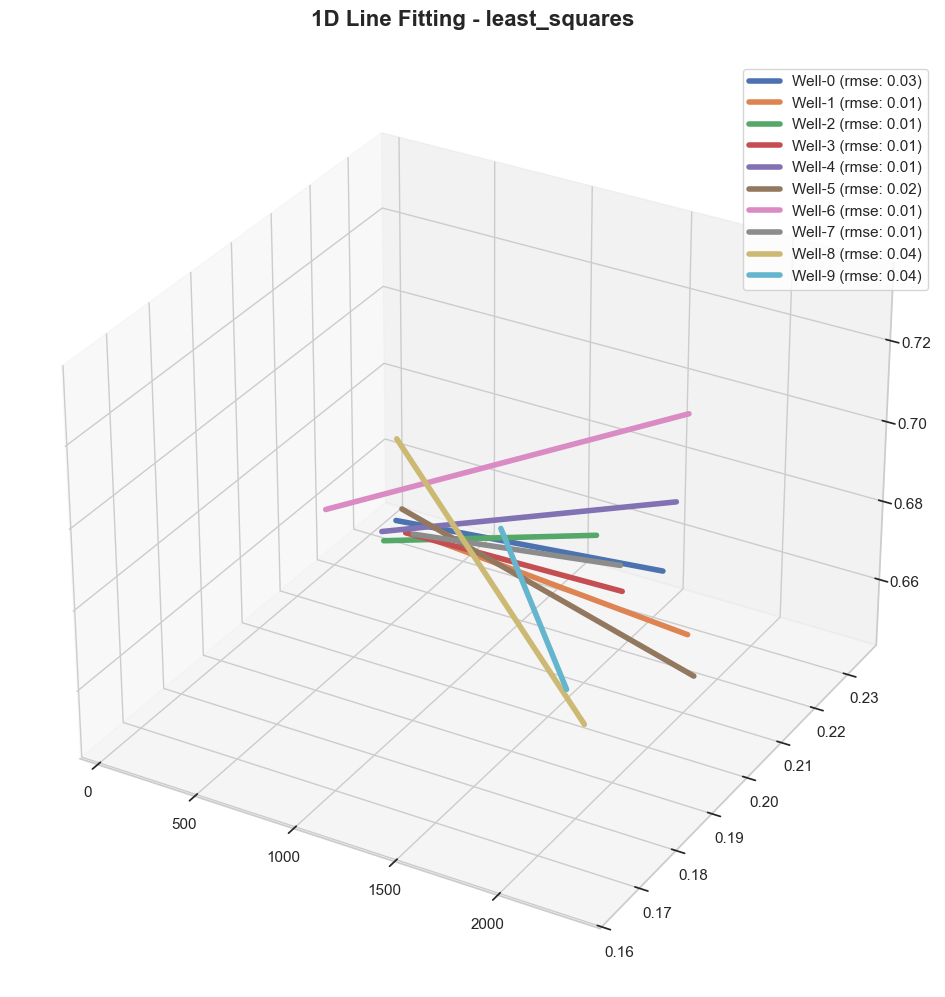

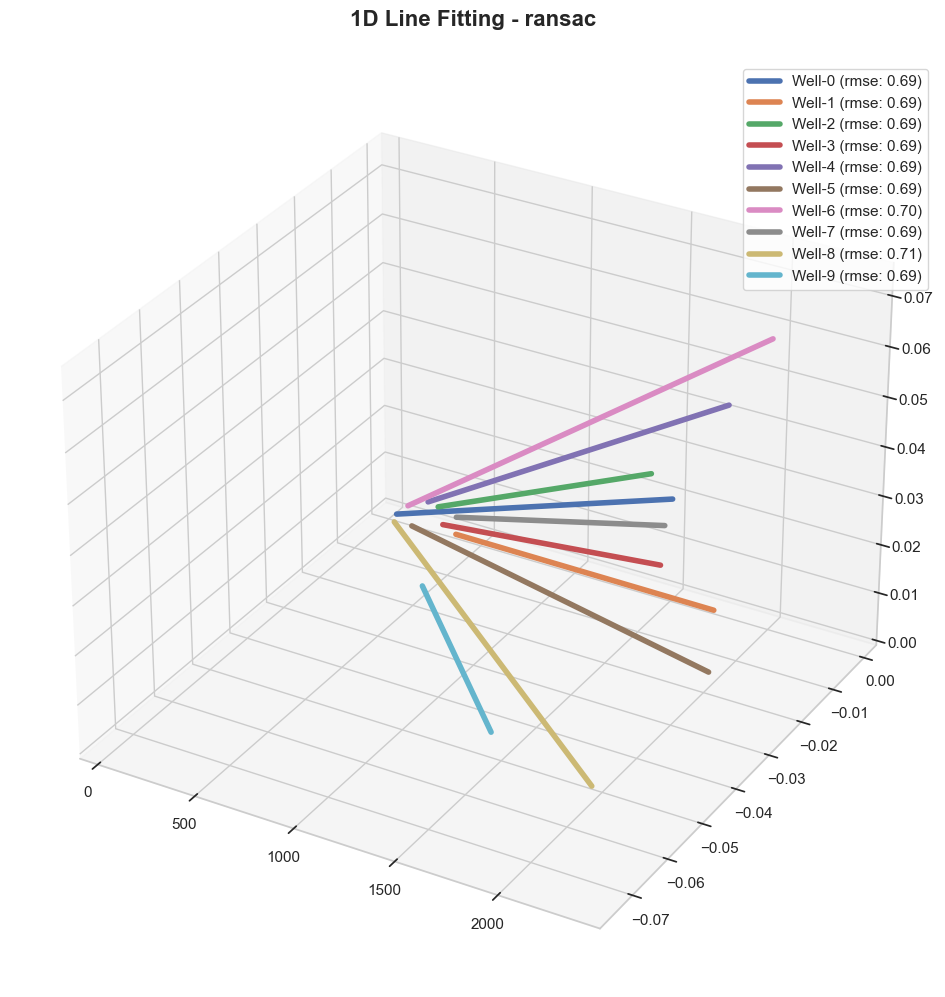

In [89]:
methods = ["pca", "least_squares", "ransac"]

for m in methods:
    fig_3d = plt.figure(figsize=(12, 10))
    ax_all = fig_3d.add_subplot(111, projection='3d')
    for i, lf in enumerate(line_fittings):
        line_points = line_fittings[i][m]['line_points']
        # print(X_outlier_features[np.where(y_outlier_labels == i)].shape)
        # print(line_points.shape)
        direction = line_fittings[i][m]['direction']
        rmse = line_fittings[i][m]['rmse']
        
        projections_line = (line_points - line_points.mean(axis=0)) @ direction
        sort_idx = np.argsort(projections_line)
        line_points_sorted = line_points[sort_idx]
        ax_all.plot(line_points_sorted[:, 0], line_points_sorted[:, 1], line_points_sorted[:, 2], 
                            linewidth=4, label=f"Well-{i} (rmse: {rmse:.2f})")
    ax_all.legend()
    
    fig_3d.suptitle(f'1D Line Fitting - {m}', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

In [90]:
line

NameError: name 'line' is not defined